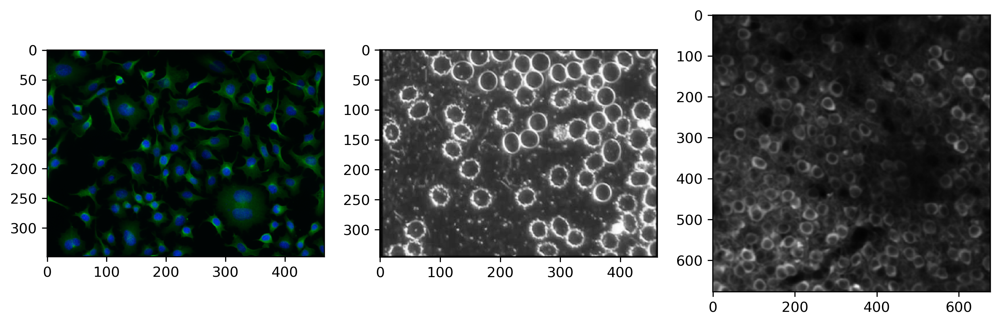

In [75]:
import numpy as np
import time, os, sys
from urllib.parse import urlparse
import skimage.io
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300
from cellpose import utils

# I will download images from website
urls = ['http://www.cellpose.org/static/images/img02.png',
        'http://www.cellpose.org/static/images/img03.png',
        'http://www.cellpose.org/static/images/img05.png']
files = []
for url in urls:
    parts = urlparse(url)
    filename = os.path.basename(parts.path)
    if not os.path.exists(filename):
        sys.stderr.write('Downloading: "{}" to {}\n'.format(url, filename))
        utils.download_url_to_file(url, filename)
    files.append(filename)

# REPLACE FILES WITH YOUR IMAGE PATHS
# files = ['img0.tif', 'img1.tif']
    
imgs = [skimage.io.imread(f) for f in files]
nimg = len(imgs)

plt.figure(figsize=(12,4))
for k,img in enumerate(imgs):
    plt.subplot(1,3,k+1)
    plt.imshow(img)

(349, 467, 3)
0 187


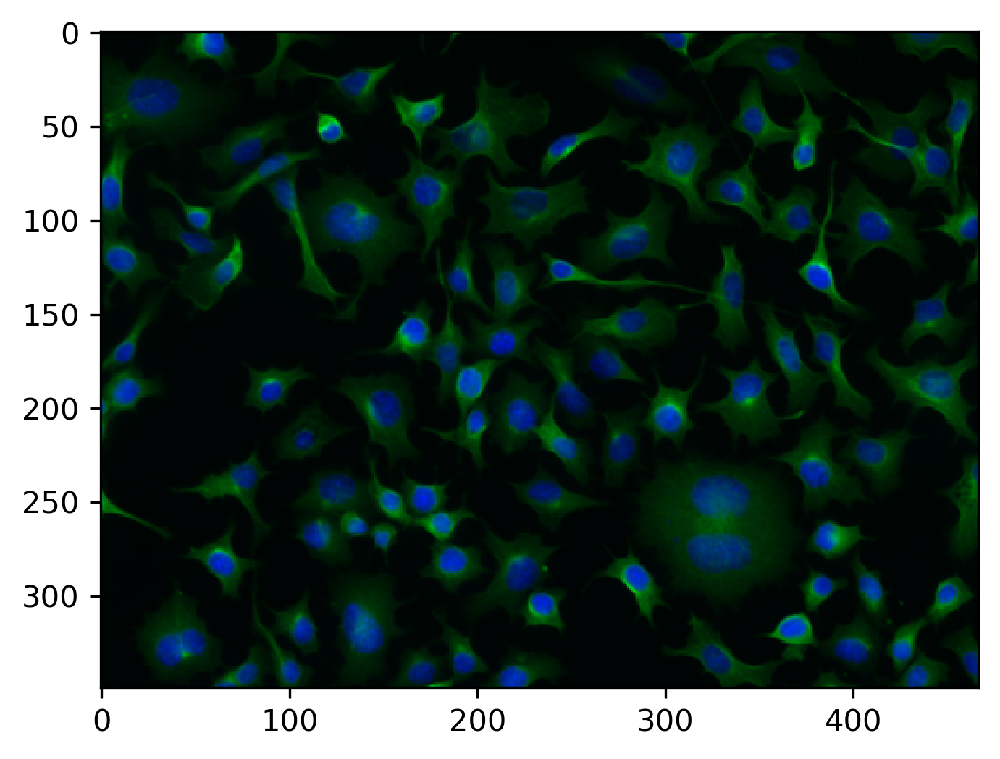

In [161]:
Image = imgs[0]
print(Image.shape)
print(Image[2].min(), Image[2].max())
plt.imshow(Image)

In [101]:
# print(imgs[0].shape)
img = np.transpose(Image, (2,0,1))
print(img.shape)

(3, 349, 467)


In [102]:
from cellpose import transforms

In [169]:
mask = transforms._taper_mask()

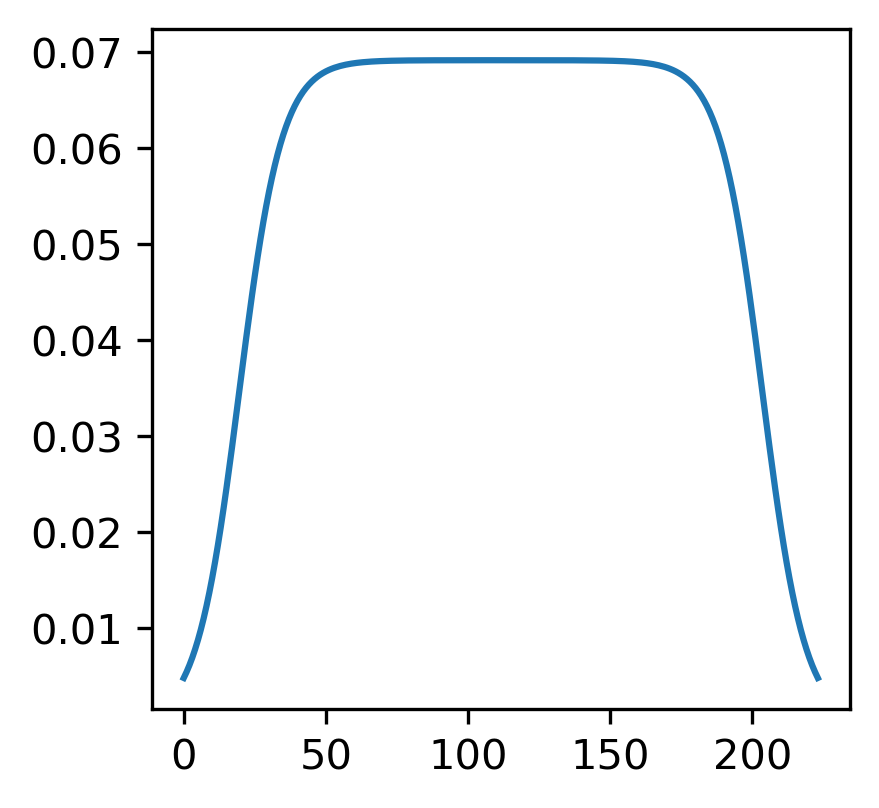

In [177]:
m1 = mask[0]
plt.figure(figsize=(3,3))
plt.plot(m1)

In [180]:
Image.shape

(349, 467, 3)

In [213]:
from cellpose import models
model0 = models.Cellpose(net_avg=False, batch_size=1)

model1 = models.Cellpose(gpu=False, model_type='cyto')




>>>> using CPU
>>>> using CPU


In [228]:
model1.pretrained_model

['/Users/qzt/.cellpose/models/cyto_0',
 '/Users/qzt/.cellpose/models/cyto_1',
 '/Users/qzt/.cellpose/models/cyto_2',
 '/Users/qzt/.cellpose/models/cyto_3']

In [227]:
%%debug
masks, flows, styles, diams = model0.eval(Image, channels=[2,1], )

NOTE: Enter 'c' at the ipdb>  prompt to continue execution.
None
> <string>(2)<module>()



ipdb>  s


--Call--
> /Users/qzt/cellpose/cellpose/models.py(75)eval()
     73                             cp_model=self.cp)
     74 
---> 75     def eval(self, x, channels=None, diameter=30., invert=False, do_3D=False,
     76              net_avg=True, tile=True, flow_threshold=0.4, cellprob_threshold=0.0,
     77              rescale=None, progress=None):



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(137)eval()
    135         """
    136 
--> 137         if not isinstance(x,list):
    138             nolist = True
    139             x = [x]



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(138)eval()
    136 
    137         if not isinstance(x,list):
--> 138             nolist = True
    139             x = [x]
    140         else:



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(139)eval()
    137         if not isinstance(x,list):
    138             nolist = True
--> 139             x = [x]
    140         else:
    141             nolist = False



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(143)eval()
    141             nolist = False
    142 
--> 143         if do_3D:
    144             for i in range(len(x)):
    145                 if x[i].ndim<3:



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(154)eval()
    152                     (x[0].shape[0], x[0].shape[-1]))
    153 
--> 154         print('processing %d images'%len(x))
    155         # make rescale into length of x
    156         if diameter is not None and diameter!=0:



ipdb>  n


processing 1 images
> /Users/qzt/cellpose/cellpose/models.py(156)eval()
    154         print('processing %d images'%len(x))
    155         # make rescale into length of x
--> 156         if diameter is not None and diameter!=0:
    157             if not isinstance(diameter, list) or len(diameter)==1 or len(diameter)<len(x):
    158                 diams = diameter * np.ones(len(x), np.float32)



ipdb>  diameter


30.0


ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(157)eval()
    155         # make rescale into length of x
    156         if diameter is not None and diameter!=0:
--> 157             if not isinstance(diameter, list) or len(diameter)==1 or len(diameter)<len(x):
    158                 diams = diameter * np.ones(len(x), np.float32)
    159             else:



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(158)eval()
    156         if diameter is not None and diameter!=0:
    157             if not isinstance(diameter, list) or len(diameter)==1 or len(diameter)<len(x):
--> 158                 diams = diameter * np.ones(len(x), np.float32)
    159             else:
    160                 diams = diameter



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(161)eval()
    159             else:
    160                 diams = diameter
--> 161             rescale = self.diam_mean / (diams.copy() * (np.pi**0.5/2))
    162         else:
    163             if rescale is not None and (not isinstance(rescale, list) or len(rescale)==1):



ipdb>  self.diam_mean


27.0


ipdb>  27/30*(np.pi**0.5/2)


0.7976042329074822


ipdb>  27/(30*(np.pi**0.5/2))


1.0155412503859615


ipdb>  30*(np.pi**0.5/2)


26.586807763582737


ipdb>  c


In [226]:
27/(np.pi**0.5/2)

30.466237511578843

In [219]:
masks.shape, styles.shape, diams.shape

((349, 467), (256,), ())

In [222]:
flows[0].shape, flows[1].shape, flows[2].shape, flows[3].shape

((349, 467, 3), (3, 349, 467), (349, 467), (2, 349, 467))

In [239]:
x = [Image]
masks, flows, styles = model0.cp.eval(x, invert=False, rescale=[1], channels=[2,1], tile=True,
                                        do_3D=False, net_avg=False, progress=None,
                                        flow_threshold=0.4, cellprob_threshold=0.0)

In [240]:
masks0 = masks[0]
flows0 = flows[0]
styles0 = styles[0]
masks0.shape, styles0.shape

((349, 467), (256,))

In [ ]:
# flow = plot.dx_to_circ(dP)
# flows.append([flow, dP, cellprob, p])

In [242]:
flows0[0].shape, flows0[1].shape, flows0[2].shape, flows0[3].shape

((349, 467, 3), (3, 349, 467), (349, 467), (2, 349, 467))

In [249]:
np.amin(flows0[1]), np.amax(flows0[1])

(-5.1868105, 5.1084733)

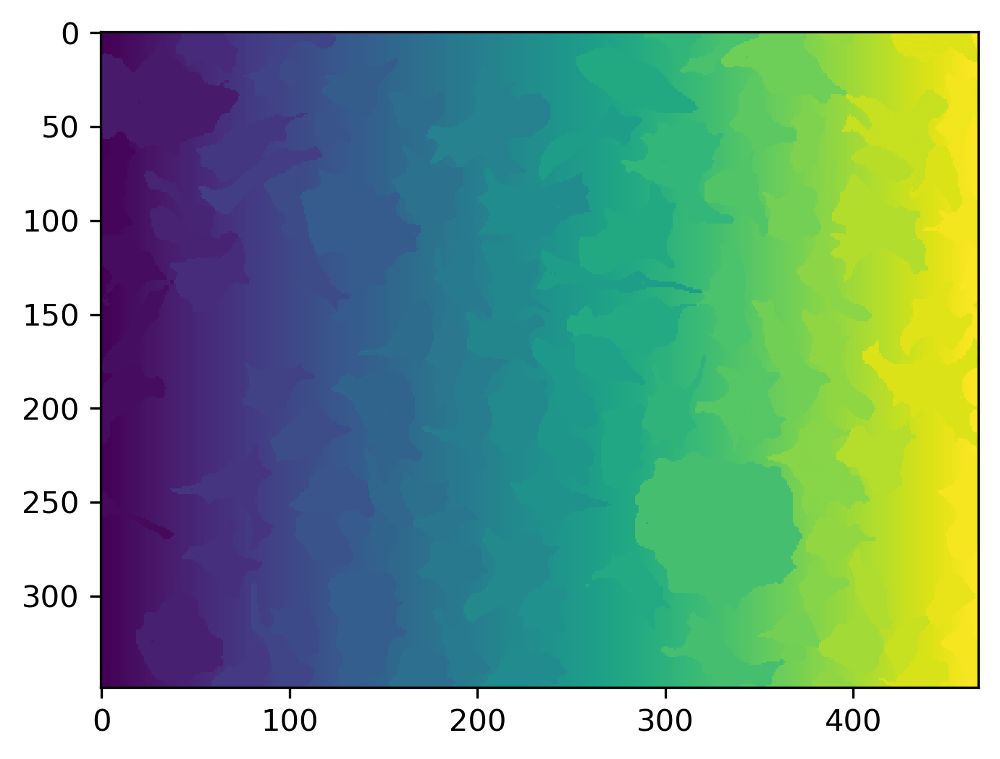

In [252]:
# plt.imshow(np.transpose(flows0[1], (1,2,0)))
# plt.imshow(flows0[2])
plt.imshow(np.squeeze(flows0[3][1]))

In [255]:
x = transforms.reshape(imgs[0], channels=[2,1], invert=False)
x = np.transpose(x, (1,2,0))
x.shape

(349, 467, 2)

In [258]:
model0.cp

In [260]:
y, style = model0.cp._run_net(x, 1, tile=True)
y.shape, style.shape

((349, 467, 3), (256,))

In [266]:
y[...,0].shape

(349, 467)

In [ ]:
# dP = np.stack((y[...,0], y[...,1]), axis=0)
# dZ = np.zeros((1,Ly,Lx), np.uint8)
# dP = np.concatenate((dP, dZ), axis=0)

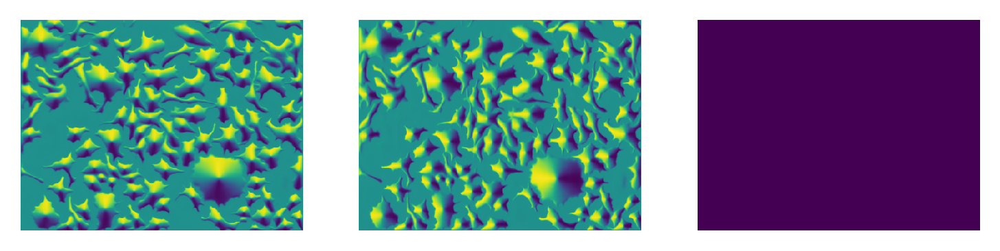

In [278]:
dP = flows0[1]
k = dP.shape[0]
for kk in range(k):
    plt.subplot(1, k, kk+1)
    plt.imshow(np.squeeze(dP[kk]))
    plt.axis('off')

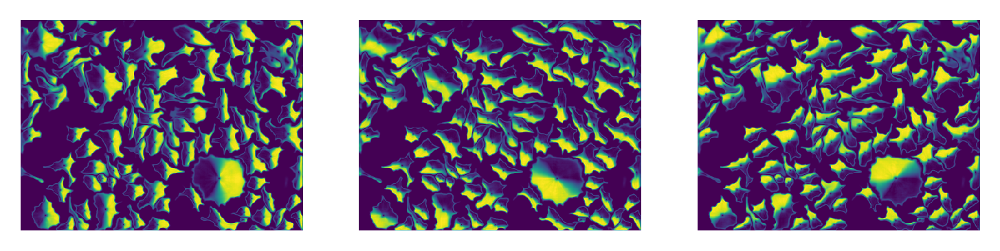

In [281]:
flow = flows0[0]
k = flow.shape[2]
for kk in range(k):
    plt.subplot(1, k, kk+1)
    plt.imshow(np.squeeze(flow[...,kk]))
    plt.axis('off')

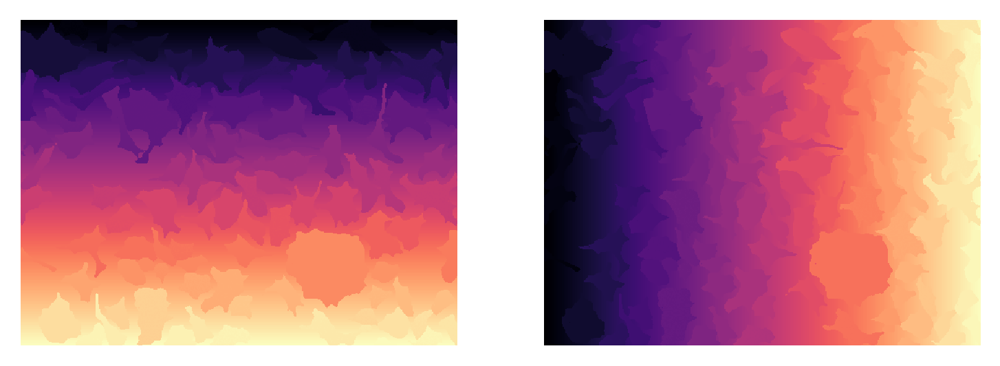

In [286]:
flow = np.transpose(flows0[3], (1,2,0))
k = flow.shape[2]
for kk in range(k):
    plt.subplot(1, k, kk+1)
    plt.imshow(np.squeeze(flow[...,kk]), cmap='magma')
    plt.axis('off')

In [289]:
Image.shape

(349, 467, 3)

In [288]:
np.savetxt('p1.txt', flow[...,1], delimiter=',')

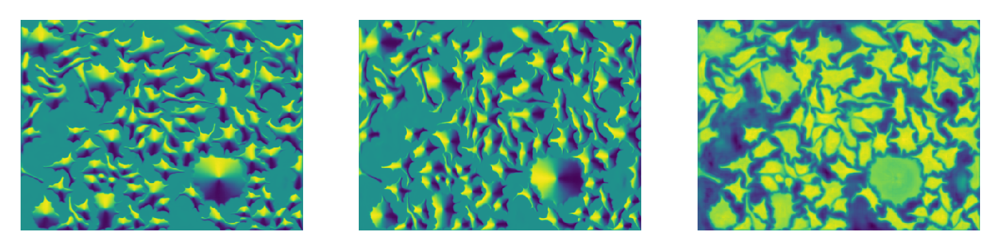

In [276]:
ni = y
k = ni.shape[2]
for kk in range(k):
    plt.subplot(1, k, kk+1)
    plt.imshow(np.squeeze(ni[...,kk]))
    plt.axis('off')

In [109]:
IMG, ysub, xsub, Ly, Lx = transforms.make_tiles(img, bsize=224, augment=False)
IMG.shape

(12, 3, 224, 224)

(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)


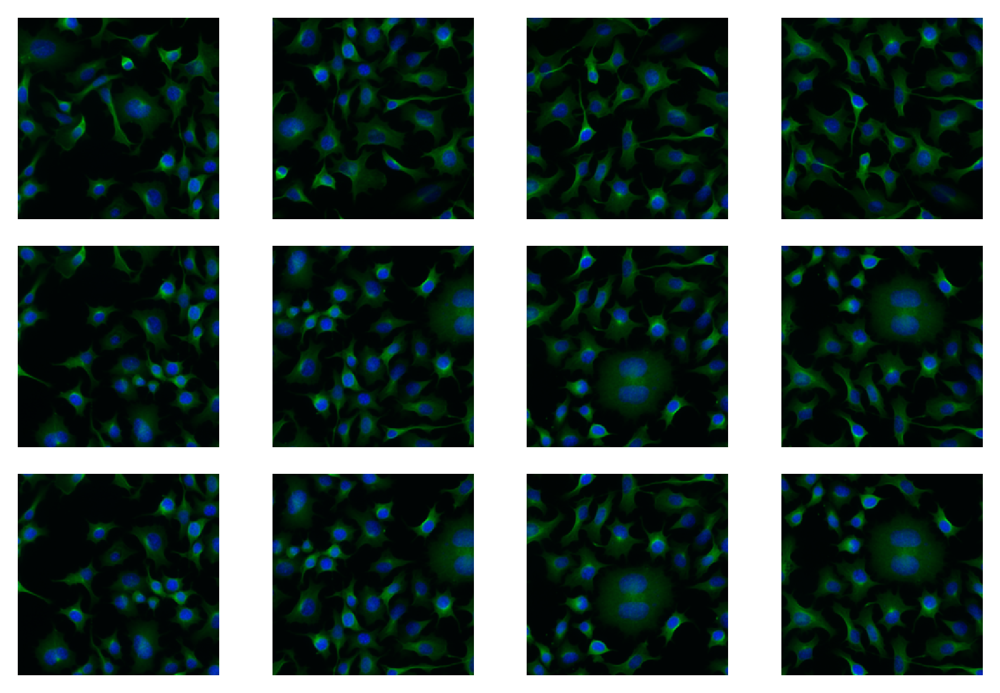

In [103]:
fig, axes = plt.subplots(ncols=4, nrows=3)

for i, ax in zip(IMG, axes.flatten()):
#     print(i.shape)
    ii = np.transpose(i, (1,2,0)).astype(int)
    print(ii.shape)
#     plt.figure(figsize=(1,1))
    ax.imshow(ii)
    ax.axis('off')
plt.tight_layout()


In [160]:
IMG[0].shape

(3, 224, 224)

In [114]:
imgtest = nd.array(np.expand_dims(IMG[0], axis=0))
imgtest.shape
            

(1, 3, 224, 224)

In [115]:
y, style = cpnet(imgtest)

In [117]:
y.shape, style.shape

((1, 3, 224, 224), (1, 256))

In [122]:
yy = np.squeeze(y.asnumpy())
ss = np.squeeze(style.asnumpy())

In [132]:
np.amax(yy[2])

10.3473625

(-0.5, 223.5, 223.5, -0.5)

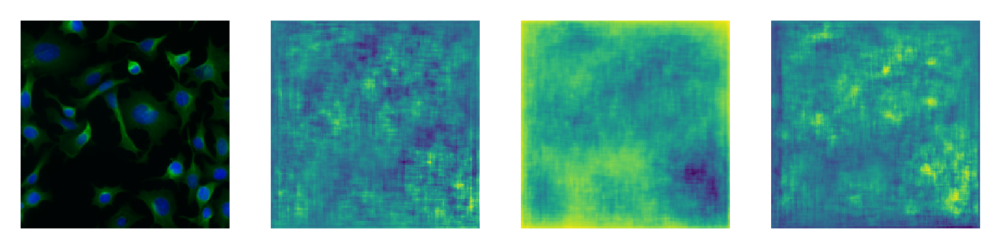

In [138]:
plt.subplot(1,4,1)
plt.imshow(np.transpose(IMG[0].astype(int), (1,2,0)))
plt.axis('off')

plt.subplot(1,4,2)
plt.imshow(yy[0])
plt.axis('off')

plt.subplot(1,4,3)
plt.imshow(yy[1])
plt.axis('off')

plt.subplot(1,4,4)
plt.imshow(yy[2])
plt.axis('off')

In [144]:
input2 = np.transpose(IMG[0], (1,2,0))
input2.shape

(224, 224, 3)

In [165]:
input2 = np.transpose(Image, (2,0,1))
input2.shape

(3, 349, 467)

In [168]:
%%debug
y2, style2 = model.cp._run_tiled(input2, bsize=224)

NOTE: Enter 'c' at the ipdb>  prompt to continue execution.
> <string>(2)<module>()



ipdb>  s


--Call--
> /Users/qzt/cellpose/cellpose/models.py(462)_run_tiled()
    460         return yup, style
    461 
--> 462     def _run_tiled(self, imgi, bsize=224):
    463         """ run network in tiles of size [bsize x bsize]
    464 



ipdb>  s


> /Users/qzt/cellpose/cellpose/models.py(492)_run_tiled()
    490 
    491         """
--> 492         IMG, ysub, xsub, Ly, Lx = transforms.make_tiles(imgi, bsize, augment=True)
    493         IMG = nd.array(IMG, ctx=self.device)
    494         nbatch = self.batch_size



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(493)_run_tiled()
    491         """
    492         IMG, ysub, xsub, Ly, Lx = transforms.make_tiles(imgi, bsize, augment=True)
--> 493         IMG = nd.array(IMG, ctx=self.device)
    494         nbatch = self.batch_size
    495         niter = int(np.ceil(IMG.shape[0]/nbatch))



ipdb>  IMG.shape


(12, 3, 224, 224)


ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(494)_run_tiled()
    492         IMG, ysub, xsub, Ly, Lx = transforms.make_tiles(imgi, bsize, augment=True)
    493         IMG = nd.array(IMG, ctx=self.device)
--> 494         nbatch = self.batch_size
    495         niter = int(np.ceil(IMG.shape[0]/nbatch))
    496         y = np.zeros((IMG.shape[0], 3, bsize, bsize))



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(495)_run_tiled()
    493         IMG = nd.array(IMG, ctx=self.device)
    494         nbatch = self.batch_size
--> 495         niter = int(np.ceil(IMG.shape[0]/nbatch))
    496         y = np.zeros((IMG.shape[0], 3, bsize, bsize))
    497         for k in range(niter):



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(496)_run_tiled()
    494         nbatch = self.batch_size
    495         niter = int(np.ceil(IMG.shape[0]/nbatch))
--> 496         y = np.zeros((IMG.shape[0], 3, bsize, bsize))
    497         for k in range(niter):
    498             irange = np.arange(nbatch*k, min(IMG.shape[0], nbatch*k+nbatch))



ipdb>  nbatch


8


ipdb>  niter


2


ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(497)_run_tiled()
    495         niter = int(np.ceil(IMG.shape[0]/nbatch))
    496         y = np.zeros((IMG.shape[0], 3, bsize, bsize))
--> 497         for k in range(niter):
    498             irange = np.arange(nbatch*k, min(IMG.shape[0], nbatch*k+nbatch))
    499             y0, style = self.net(IMG[irange])



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(498)_run_tiled()
    496         y = np.zeros((IMG.shape[0], 3, bsize, bsize))
    497         for k in range(niter):
--> 498             irange = np.arange(nbatch*k, min(IMG.shape[0], nbatch*k+nbatch))
    499             y0, style = self.net(IMG[irange])
    500             y[irange] = y0.asnumpy()



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(499)_run_tiled()
    497         for k in range(niter):
    498             irange = np.arange(nbatch*k, min(IMG.shape[0], nbatch*k+nbatch))
--> 499             y0, style = self.net(IMG[irange])
    500             y[irange] = y0.asnumpy()
    501             if k==0:



ipdb>  irange


array([0, 1, 2, 3, 4, 5, 6, 7])


ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(500)_run_tiled()
    498             irange = np.arange(nbatch*k, min(IMG.shape[0], nbatch*k+nbatch))
    499             y0, style = self.net(IMG[irange])
--> 500             y[irange] = y0.asnumpy()
    501             if k==0:
    502                 styles = style.asnumpy()[0]



ipdb>  y0.shape


(8, 3, 224, 224)


ipdb>  style.shape


(8, 256)


ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(501)_run_tiled()
    499             y0, style = self.net(IMG[irange])
    500             y[irange] = y0.asnumpy()
--> 501             if k==0:
    502                 styles = style.asnumpy()[0]
    503             styles += style.asnumpy().sum(axis=0)



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(502)_run_tiled()
    500             y[irange] = y0.asnumpy()
    501             if k==0:
--> 502                 styles = style.asnumpy()[0]
    503             styles += style.asnumpy().sum(axis=0)
    504         styles /= IMG.shape[0]



ipdb>  k


0


ipdb>  styles


*** NameError: name 'styles' is not defined


ipdb>  style.asnumpy()[0].shape


(256,)


ipdb>  style.asnumpy().shape


(8, 256)


ipdb>  styles


*** NameError: name 'styles' is not defined


ipdb>  style.shape


(8, 256)


ipdb>  style[0]



[-8.53253454e-02  1.15434863e-02  5.57724722e-02  3.68754193e-02
 -1.40232788e-02 -3.75643112e-02  5.16883098e-02  7.46107250e-02
  2.89469063e-02  2.50581913e-02  3.01214270e-02 -7.75144473e-02
  8.86868089e-02 -2.56189331e-02 -1.91171505e-02  5.47624342e-02
 -4.08104882e-02  8.40802193e-02  2.68862192e-02  1.69601794e-02
 -6.42844364e-02 -4.92186248e-02  1.05268821e-01  5.74361570e-02
  1.23678781e-02 -2.45308354e-02 -5.30357473e-02  4.95872796e-02
 -4.58685681e-02  5.93165010e-02 -7.87690660e-05 -4.03324179e-02
 -1.14139490e-01 -3.87946181e-02 -3.81285734e-02  2.24470630e-01
 -8.44877362e-02  1.05954774e-01  3.87731679e-02 -1.14593379e-01
 -2.88883671e-02  4.27613147e-02  4.75984402e-02  7.31697679e-02
  5.78518100e-02  1.48095950e-01 -4.89037950e-03 -7.30668679e-02
 -3.44969630e-02  9.72920749e-03 -4.98083904e-02  7.84867257e-02
 -7.24477097e-02  1.24248965e-02  1.02058332e-02  9.41448286e-02
  1.38757199e-01 -7.98112378e-02  2.72525046e-02 -6.92643225e-02
 -1.27589647e-02  1.2548

ipdb>  style[0].shape


(256,)


ipdb>  ll


    462     def _run_tiled(self, imgi, bsize=224):
    463         """ run network in tiles of size [bsize x bsize]
    464 
    465         First image is split into overlapping tiles of size [bsize x bsize].
    466         Then 4 versions of each tile are created:
    467             * original
    468             * flipped vertically
    469             * flipped horizontally
    470             * flipped vertically and horizontally
    471         The average of the network output over tiles is returned.
    472 
    473         Parameters
    474         --------------
    475 
    476         imgi: array [nchan x Ly x Lx]
    477 
    478         bsize: int (optional, default 224)
    479             size of tiles to use in pixels [bsize x bsize]
    480 
    481         Returns
    482         ------------------
    483 
    484         yf: array [3 x Ly x Lx]
    485             yf is averaged over tiles
    486             yf[0] is Y flow; yf[1] is X flow; yf[2] is cell proba

ipdb>  ysub


[[0, 224], [0, 224], [0, 224], [0, 224], [112, 336], [112, 336], [112, 336], [112, 336], [125, 349], [125, 349], [125, 349], [125, 349]]


ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(503)_run_tiled()
    501             if k==0:
    502                 styles = style.asnumpy()[0]
--> 503             styles += style.asnumpy().sum(axis=0)
    504         styles /= IMG.shape[0]
    505         y = transforms.unaugment_tiles(y)



ipdb>  styles.shape


(256,)


ipdb>  IMG.shape[0]


12


ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(497)_run_tiled()
    495         niter = int(np.ceil(IMG.shape[0]/nbatch))
    496         y = np.zeros((IMG.shape[0], 3, bsize, bsize))
--> 497         for k in range(niter):
    498             irange = np.arange(nbatch*k, min(IMG.shape[0], nbatch*k+nbatch))
    499             y0, style = self.net(IMG[irange])



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(498)_run_tiled()
    496         y = np.zeros((IMG.shape[0], 3, bsize, bsize))
    497         for k in range(niter):
--> 498             irange = np.arange(nbatch*k, min(IMG.shape[0], nbatch*k+nbatch))
    499             y0, style = self.net(IMG[irange])
    500             y[irange] = y0.asnumpy()



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(499)_run_tiled()
    497         for k in range(niter):
    498             irange = np.arange(nbatch*k, min(IMG.shape[0], nbatch*k+nbatch))
--> 499             y0, style = self.net(IMG[irange])
    500             y[irange] = y0.asnumpy()
    501             if k==0:



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(500)_run_tiled()
    498             irange = np.arange(nbatch*k, min(IMG.shape[0], nbatch*k+nbatch))
    499             y0, style = self.net(IMG[irange])
--> 500             y[irange] = y0.asnumpy()
    501             if k==0:
    502                 styles = style.asnumpy()[0]



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(501)_run_tiled()
    499             y0, style = self.net(IMG[irange])
    500             y[irange] = y0.asnumpy()
--> 501             if k==0:
    502                 styles = style.asnumpy()[0]
    503             styles += style.asnumpy().sum(axis=0)



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(503)_run_tiled()
    501             if k==0:
    502                 styles = style.asnumpy()[0]
--> 503             styles += style.asnumpy().sum(axis=0)
    504         styles /= IMG.shape[0]
    505         y = transforms.unaugment_tiles(y)



ipdb>  styles.shape


(256,)


ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(497)_run_tiled()
    495         niter = int(np.ceil(IMG.shape[0]/nbatch))
    496         y = np.zeros((IMG.shape[0], 3, bsize, bsize))
--> 497         for k in range(niter):
    498             irange = np.arange(nbatch*k, min(IMG.shape[0], nbatch*k+nbatch))
    499             y0, style = self.net(IMG[irange])



ipdb>  niter


2


ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(504)_run_tiled()
    502                 styles = style.asnumpy()[0]
    503             styles += style.asnumpy().sum(axis=0)
--> 504         styles /= IMG.shape[0]
    505         y = transforms.unaugment_tiles(y)
    506         yf = transforms.average_tiles(y, ysub, xsub, Ly, Lx)



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(505)_run_tiled()
    503             styles += style.asnumpy().sum(axis=0)
    504         styles /= IMG.shape[0]
--> 505         y = transforms.unaugment_tiles(y)
    506         yf = transforms.average_tiles(y, ysub, xsub, Ly, Lx)
    507         yf = yf[:,:imgi.shape[1],:imgi.shape[2]]



ipdb>  y.shape


(12, 3, 224, 224)


ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(506)_run_tiled()
    504         styles /= IMG.shape[0]
    505         y = transforms.unaugment_tiles(y)
--> 506         yf = transforms.average_tiles(y, ysub, xsub, Ly, Lx)
    507         yf = yf[:,:imgi.shape[1],:imgi.shape[2]]
    508         styles /= (styles**2).sum()**0.5



ipdb>  y.shape


(12, 3, 224, 224)


ipdb>  s


--Call--
> /Users/qzt/cellpose/cellpose/transforms.py(48)average_tiles()
     46     return y
     47 
---> 48 def average_tiles(y, ysub, xsub, Ly, Lx):
     49     """ average results of network over tiles
     50 



ipdb>  s


> /Users/qzt/cellpose/cellpose/transforms.py(78)average_tiles()
     76 
     77     """
---> 78     Navg = np.zeros((Ly,Lx))
     79     yf = np.zeros((3, Ly, Lx), np.float32)
     80     # taper edges of tiles



ipdb>  n


> /Users/qzt/cellpose/cellpose/transforms.py(79)average_tiles()
     77     """
     78     Navg = np.zeros((Ly,Lx))
---> 79     yf = np.zeros((3, Ly, Lx), np.float32)
     80     # taper edges of tiles
     81     mask = _taper_mask(bsize=y.shape[-1])



ipdb>  Navg.shape


(349, 467)


ipdb>  n


> /Users/qzt/cellpose/cellpose/transforms.py(81)average_tiles()
     79     yf = np.zeros((3, Ly, Lx), np.float32)
     80     # taper edges of tiles
---> 81     mask = _taper_mask(bsize=y.shape[-1])
     82     for j in range(len(ysub)):
     83         yf[:, ysub[j][0]:ysub[j][1],  xsub[j][0]:xsub[j][1]] += y[j] * mask



ipdb>  yf.shape


(3, 349, 467)


ipdb>  s


--Call--
> /Users/qzt/cellpose/cellpose/transforms.py(5)_taper_mask()
      3 import cv2
      4 
----> 5 def _taper_mask(bsize=224, sig=7.5):
      6     xm = np.arange(bsize)
      7     xm = np.abs(xm - xm.mean())



ipdb>  s


> /Users/qzt/cellpose/cellpose/transforms.py(6)_taper_mask()
      4 
      5 def _taper_mask(bsize=224, sig=7.5):
----> 6     xm = np.arange(bsize)
      7     xm = np.abs(xm - xm.mean())
      8     mask = 1/(1 + np.exp((xm - (bsize/2-20)) / sig))



ipdb>  n


> /Users/qzt/cellpose/cellpose/transforms.py(7)_taper_mask()
      5 def _taper_mask(bsize=224, sig=7.5):
      6     xm = np.arange(bsize)
----> 7     xm = np.abs(xm - xm.mean())
      8     mask = 1/(1 + np.exp((xm - (bsize/2-20)) / sig))
      9     mask = mask * mask[:, np.newaxis]



ipdb>  xm


array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

ipdb>  xm.mean()


111.5


ipdb>  n


> /Users/qzt/cellpose/cellpose/transforms.py(8)_taper_mask()
      6     xm = np.arange(bsize)
      7     xm = np.abs(xm - xm.mean())
----> 8     mask = 1/(1 + np.exp((xm - (bsize/2-20)) / sig))
      9     mask = mask * mask[:, np.newaxis]
     10     return mask



ipdb>  xm


array([111.5, 110.5, 109.5, 108.5, 107.5, 106.5, 105.5, 104.5, 103.5,
       102.5, 101.5, 100.5,  99.5,  98.5,  97.5,  96.5,  95.5,  94.5,
        93.5,  92.5,  91.5,  90.5,  89.5,  88.5,  87.5,  86.5,  85.5,
        84.5,  83.5,  82.5,  81.5,  80.5,  79.5,  78.5,  77.5,  76.5,
        75.5,  74.5,  73.5,  72.5,  71.5,  70.5,  69.5,  68.5,  67.5,
        66.5,  65.5,  64.5,  63.5,  62.5,  61.5,  60.5,  59.5,  58.5,
        57.5,  56.5,  55.5,  54.5,  53.5,  52.5,  51.5,  50.5,  49.5,
        48.5,  47.5,  46.5,  45.5,  44.5,  43.5,  42.5,  41.5,  40.5,
        39.5,  38.5,  37.5,  36.5,  35.5,  34.5,  33.5,  32.5,  31.5,
        30.5,  29.5,  28.5,  27.5,  26.5,  25.5,  24.5,  23.5,  22.5,
        21.5,  20.5,  19.5,  18.5,  17.5,  16.5,  15.5,  14.5,  13.5,
        12.5,  11.5,  10.5,   9.5,   8.5,   7.5,   6.5,   5.5,   4.5,
         3.5,   2.5,   1.5,   0.5,   0.5,   1.5,   2.5,   3.5,   4.5,
         5.5,   6.5,   7.5,   8.5,   9.5,  10.5,  11.5,  12.5,  13.5,
        14.5,  15.5,

ipdb>  mask


*** NameError: name 'mask' is not defined


ipdb>  n


> /Users/qzt/cellpose/cellpose/transforms.py(9)_taper_mask()
      7     xm = np.abs(xm - xm.mean())
      8     mask = 1/(1 + np.exp((xm - (bsize/2-20)) / sig))
----> 9     mask = mask * mask[:, np.newaxis]
     10     return mask
     11 



ipdb>  mask.shape


(224,)


ipdb>  mask


array([0.06913842, 0.07822826, 0.08839968, 0.09975049, 0.11237911,
       0.12638209, 0.14185106, 0.1588691 , 0.1775065 , 0.19781611,
       0.2198284 , 0.24354647, 0.26894142, 0.29594837, 0.32446368,
       0.35434369, 0.3854055 , 0.41742979, 0.450166  , 0.4833395 ,
       0.5166605 , 0.549834  , 0.58257021, 0.6145945 , 0.64565631,
       0.67553632, 0.70405163, 0.73105858, 0.75645353, 0.7801716 ,
       0.80218389, 0.8224935 , 0.8411309 , 0.85814894, 0.87361791,
       0.88762089, 0.90024951, 0.91160032, 0.92177174, 0.93086158,
       0.93896515, 0.94617384, 0.95257413, 0.95824696, 0.96326741,
       0.96770454, 0.97162147, 0.97507557, 0.97811873, 0.98079765,
       0.98315423, 0.98522597, 0.98704627, 0.98864488, 0.9900482 ,
       0.99127962, 0.99235984, 0.99330715, 0.9941377 , 0.99486571,
       0.99550373, 0.99606277, 0.99655255, 0.99698158, 0.99735737,
       0.99768647, 0.99797468, 0.99822705, 0.99844801, 0.99864148,
       0.99881086, 0.99895914, 0.99908895, 0.99920258, 0.99930

ipdb>  n


> /Users/qzt/cellpose/cellpose/transforms.py(10)_taper_mask()
      8     mask = 1/(1 + np.exp((xm - (bsize/2-20)) / sig))
      9     mask = mask * mask[:, np.newaxis]
---> 10     return mask
     11 
     12 def unaugment_tiles(y):



ipdb>  mask


array([[0.00478012, 0.00540858, 0.00611181, ..., 0.00611181, 0.00540858,
        0.00478012],
       [0.00540858, 0.00611966, 0.00691535, ..., 0.00691535, 0.00611966,
        0.00540858],
       [0.00611181, 0.00691535, 0.0078145 , ..., 0.0078145 , 0.00691535,
        0.00611181],
       ...,
       [0.00611181, 0.00691535, 0.0078145 , ..., 0.0078145 , 0.00691535,
        0.00611181],
       [0.00540858, 0.00611966, 0.00691535, ..., 0.00691535, 0.00611966,
        0.00540858],
       [0.00478012, 0.00540858, 0.00611181, ..., 0.00611181, 0.00540858,
        0.00478012]])


ipdb>  mask.shape


(224, 224)


ipdb>  n


--Return--
array([[0.004... 0.00478012]])
> /Users/qzt/cellpose/cellpose/transforms.py(10)_taper_mask()
      8     mask = 1/(1 + np.exp((xm - (bsize/2-20)) / sig))
      9     mask = mask * mask[:, np.newaxis]
---> 10     return mask
     11 
     12 def unaugment_tiles(y):



ipdb>  n


> /Users/qzt/cellpose/cellpose/transforms.py(82)average_tiles()
     80     # taper edges of tiles
     81     mask = _taper_mask(bsize=y.shape[-1])
---> 82     for j in range(len(ysub)):
     83         yf[:, ysub[j][0]:ysub[j][1],  xsub[j][0]:xsub[j][1]] += y[j] * mask
     84         Navg[ysub[j][0]:ysub[j][1],  xsub[j][0]:xsub[j][1]] += mask



ipdb>  n


> /Users/qzt/cellpose/cellpose/transforms.py(83)average_tiles()
     81     mask = _taper_mask(bsize=y.shape[-1])
     82     for j in range(len(ysub)):
---> 83         yf[:, ysub[j][0]:ysub[j][1],  xsub[j][0]:xsub[j][1]] += y[j] * mask
     84         Navg[ysub[j][0]:ysub[j][1],  xsub[j][0]:xsub[j][1]] += mask
     85     yf /= Navg



ipdb>  j


*** The 'jump' command requires a line number


ipdb>  p j


0


ipdb>  ysub[0][0]


0


ipdb>  ysub[0][1]


224


ipdb>  y.shape


(12, 3, 224, 224)


ipdb>  n


> /Users/qzt/cellpose/cellpose/transforms.py(84)average_tiles()
     82     for j in range(len(ysub)):
     83         yf[:, ysub[j][0]:ysub[j][1],  xsub[j][0]:xsub[j][1]] += y[j] * mask
---> 84         Navg[ysub[j][0]:ysub[j][1],  xsub[j][0]:xsub[j][1]] += mask
     85     yf /= Navg
     86     return yf



ipdb>  until


> /Users/qzt/cellpose/cellpose/transforms.py(85)average_tiles()
     83         yf[:, ysub[j][0]:ysub[j][1],  xsub[j][0]:xsub[j][1]] += y[j] * mask
     84         Navg[ysub[j][0]:ysub[j][1],  xsub[j][0]:xsub[j][1]] += mask
---> 85     yf /= Navg
     86     return yf
     87 



ipdb>  Navg.shape


(349, 467)


ipdb>  Navg


array([[0.00478012, 0.00540858, 0.00611181, ..., 0.00611181, 0.00540858,
        0.00478012],
       [0.00540858, 0.00611966, 0.00691535, ..., 0.00691535, 0.00611966,
        0.00540858],
       [0.00611181, 0.00691535, 0.0078145 , ..., 0.0078145 , 0.00691535,
        0.00611181],
       ...,
       [0.00611181, 0.00691535, 0.0078145 , ..., 0.0078145 , 0.00691535,
        0.00611181],
       [0.00540858, 0.00611966, 0.00691535, ..., 0.00691535, 0.00611966,
        0.00540858],
       [0.00478012, 0.00540858, 0.00611181, ..., 0.00611181, 0.00540858,
        0.00478012]])


ipdb>  Navg.max()


8.70001779908491


ipdb>  ll


     48 def average_tiles(y, ysub, xsub, Ly, Lx):
     49     """ average results of network over tiles
     50 
     51     Parameters
     52     -------------
     53 
     54     y: float, [ntiles x 3 x bsize x bsize]
     55         output of cellpose network for each tile
     56 
     57     ysub : list
     58         list of arrays with start and end of tiles in Y of length ntiles
     59 
     60     xsub : list
     61         list of arrays with start and end of tiles in X of length ntiles
     62 
     63     Ly : int
     64         size of pre-tiled image in Y (may be larger than original image if
     65         image size is less than bsize)
     66 
     67     Lx : int
     68         size of pre-tiled image in X (may be larger than original image if
     69         image size is less than bsize)
     70 
     71     Returns
     72     -------------
     73 
     74     yf: float32, [3 x Ly x Lx]
     75         network output averaged over tiles
     76 
     77   

ipdb>  n


> /Users/qzt/cellpose/cellpose/transforms.py(86)average_tiles()
     84         Navg[ysub[j][0]:ysub[j][1],  xsub[j][0]:xsub[j][1]] += mask
     85     yf /= Navg
---> 86     return yf
     87 
     88 def make_tiles(imgi, bsize=224, augment=True):



ipdb>  yf.shape


(3, 349, 467)


ipdb>  y[0].shape


(3, 224, 224)


ipdb>  n


--Return--
array([[[ 0.4...dtype=float32)
> /Users/qzt/cellpose/cellpose/transforms.py(86)average_tiles()
     84         Navg[ysub[j][0]:ysub[j][1],  xsub[j][0]:xsub[j][1]] += mask
     85     yf /= Navg
---> 86     return yf
     87 
     88 def make_tiles(imgi, bsize=224, augment=True):



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(507)_run_tiled()
    505         y = transforms.unaugment_tiles(y)
    506         yf = transforms.average_tiles(y, ysub, xsub, Ly, Lx)
--> 507         yf = yf[:,:imgi.shape[1],:imgi.shape[2]]
    508         styles /= (styles**2).sum()**0.5
    509         del IMG



ipdb>  imgi.shape


(3, 349, 467)


ipdb>  yf.shape


(3, 349, 467)


ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(508)_run_tiled()
    506         yf = transforms.average_tiles(y, ysub, xsub, Ly, Lx)
    507         yf = yf[:,:imgi.shape[1],:imgi.shape[2]]
--> 508         styles /= (styles**2).sum()**0.5
    509         del IMG
    510         gc.collect()



ipdb>  style.shape


(4, 256)


ipdb>  styles.shape


(256,)


ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(509)_run_tiled()
    507         yf = yf[:,:imgi.shape[1],:imgi.shape[2]]
    508         styles /= (styles**2).sum()**0.5
--> 509         del IMG
    510         gc.collect()
    511         return yf, styles



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(510)_run_tiled()
    508         styles /= (styles**2).sum()**0.5
    509         del IMG
--> 510         gc.collect()
    511         return yf, styles
    512 



ipdb>  n


> /Users/qzt/cellpose/cellpose/models.py(511)_run_tiled()
    509         del IMG
    510         gc.collect()
--> 511         return yf, styles
    512 
    513     def _run_net(self, img, rsz=1.0, tile=True, bsize=224):



ipdb>  n


--Return--
(array([[[ 0.4...dtype=float32), array([-0.084...dtype=float32))
> /Users/qzt/cellpose/cellpose/models.py(511)_run_tiled()
    509         del IMG
    510         gc.collect()
--> 511         return yf, styles
    512 
    513     def _run_net(self, img, rsz=1.0, tile=True, bsize=224):



ipdb>  n


--Return--
None
> <string>(2)<module>()



ipdb>  n


In [167]:
y2.shape

(3, 349, 467)

In [157]:
y2[...,0].shape

(224, 224)

(-0.5, 466.5, 348.5, -0.5)

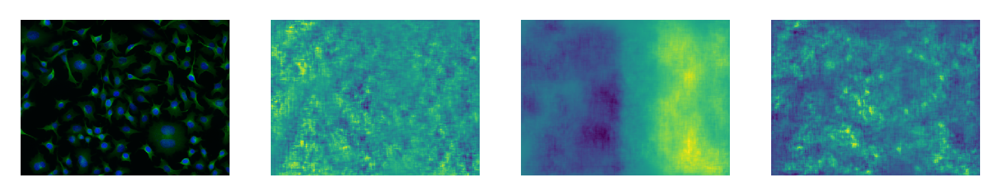

In [164]:
plt.subplot(1,4,1)
plt.imshow(Image.astype(int))
plt.axis('off')

plt.subplot(1,4,2)
plt.imshow(y2[...,0])
plt.axis('off')

plt.subplot(1,4,3)
plt.imshow(y2[...,1])
plt.axis('off')

plt.subplot(1,4,4)
plt.imshow(y2[...,2])
plt.axis('off')

In [155]:
style2

array([0.31622777, 0.31622777, 0.31622777, 0.31622777, 0.31622777,
       0.31622777, 0.31622777, 0.31622777, 0.31622777, 0.31622777])

In [1]:
# RUN CELLPOSE

from cellpose import models

# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.Cellpose(gpu=False, model_type='cyto')


>>>> using CPU


In [11]:
model.pretrained_model

['/Users/qzt/.cellpose/models/cyto_0',
 '/Users/qzt/.cellpose/models/cyto_1',
 '/Users/qzt/.cellpose/models/cyto_2',
 '/Users/qzt/.cellpose/models/cyto_3']

In [12]:
model.pretrained_size

'/Users/qzt/.cellpose/models/size_cyto_0.npy'

In [21]:
dir(model.sz)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_size_estimation',
 'cp',
 'device',
 'diam_mean',
 'eval',
 'params',
 'pretrained_size']

In [28]:
model.sz.params['diam_mean']

27.0

In [17]:
# cpnet = model.cp.net
model.sz.params['smean'].shape

(256,)

In [ ]:
cpnet.hybridize()
# cpnet.collect_params().initialize()

In [4]:
cpnet.downsample.down[0]

resdown(
  (conv): HybridSequential(
    (0): HybridSequential(
      (0): BatchNorm(axis=1, eps=1e-05, momentum=0.9, fix_gamma=False, use_global_stats=False, in_channels=None)
      (1): Activation(relu)
      (2): Conv2D(None -> 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (1): HybridSequential(
      (0): BatchNorm(axis=1, eps=1e-05, momentum=0.9, fix_gamma=False, use_global_stats=False, in_channels=None)
      (1): Activation(relu)
      (2): Conv2D(None -> 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (2): HybridSequential(
      (0): BatchNorm(axis=1, eps=1e-05, momentum=0.9, fix_gamma=False, use_global_stats=False, in_channels=None)
      (1): Activation(relu)
      (2): Conv2D(None -> 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (3): HybridSequential(
      (0): BatchNorm(axis=1, eps=1e-05, momentum=0.9, fix_gamma=False, use_global_stats=False, in_channels=None)
      (1): Activation(relu)
      (2): Conv2D(None -> 32, 

In [5]:
# cpnet

In [63]:
from mxnet import nd, gluon, init, autograd
from mxnet.gluon import nn

net = nn.Sequential()
net.add(nn.Conv2D(channels=6, kernel_size=5, activation='relu'),
        nn.MaxPool2D(pool_size=2, strides=2),
        nn.Conv2D(channels=16, kernel_size=3, activation='relu'),
        nn.MaxPool2D(pool_size=2, strides=2),
        nn.Flatten(),
        nn.Dense(120, activation="relu"),
        nn.Dense(84, activation="relu"),
        nn.Dense(10))
net.initialize(init=init.Xavier())

In [27]:
cpnet.output

HybridSequential(
  (0): BatchNorm(axis=1, eps=1e-05, momentum=0.9, fix_gamma=False, use_global_stats=False, in_channels=None)
  (1): Activation(relu)
  (2): Conv2D(None -> 3, kernel_size=(1, 1), stride=(1, 1))
)

In [54]:
from mxnet import ndarray as nd
x = nd.random.uniform(-1,1,(1,3,256,256))
x.shape

(1, 3, 256, 256)

In [55]:
y, style = cpnet(x)

In [56]:
style[0].shape

(256,)

In [51]:
len(y[0])

3

In [6]:
import mxnet as mx
x = mx.sym.var('input', shape=(8,3,256,256))

In [44]:
x = nd.random.uniform(-1,1,(1,3,28,28))

In [7]:
sym = cpnet(x)

In [8]:
sym[0]

<Symbol cpnet0_hybridsequential0_conv0_fwd>

In [47]:
dir(net[0])

['__call__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_active',
 '_alias',
 '_backend',
 '_backend_opts',
 '_build_cache',
 '_cached_graph',
 '_cached_op',
 '_call_cached_op',
 '_callback',
 '_called_infer_shape_already',
 '_channels',
 '_check_container_with_block',
 '_children',
 '_clear_cached_op',
 '_collect_params_with_prefix',
 '_deferred_infer_shape',
 '_empty_prefix',
 '_flags',
 '_forward_hooks',
 '_forward_pre_hooks',
 '_get_graph',
 '_get_graph_v1',
 '_get_graph_v2',
 '_in_channels',
 '_in_format',
 '_infer_attrs',
 '_kwargs',
 '_monitor_all',
 '_name',
 '_op_name',
 '_out_format',
 '_params',
 '_prefix',
 '_profiler_scope_name',
 '_reg_params',
 '_s

In [59]:
print(net[1].infer_shape(x))

None


NoneType

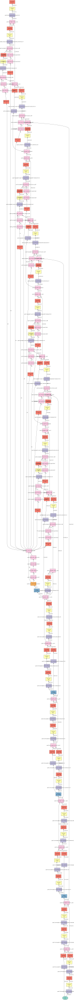

In [9]:
mx.viz.plot_network(sym[0], shape={'input':(8,3,256,256)})

In [39]:
img = np.full((1,128,128), 1 )
img.shape

(1, 128, 128)

In [35]:
if img.shape[0]<3:
    print('true')
    img = np.transpose(img, (1,2,0))

true


In [36]:
img.shape

(128, 128, 1)

In [37]:
if img.shape[-1]==1:
    print('true')
    img = np.concatenate((img, 0.*img), axis=-1)

true


In [38]:
img.shape

(128, 128, 2)

In [16]:
sym[0].list_outputs()

['cpnet0_hybridsequential0_conv0_fwd_output']

In [2]:
# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

# or if you have different types of channels in each image
channels = [[2,3], [0,0], [0,0]]

# if diameter is set to None, the size of the cells is estimated on a per image basis
# you can set the average cell `diameter` in pixels yourself (recommended) 
# diameter can be a list or a single number for all images
masks, flows, styles, diams = model.eval(imgs, diameter=None, channels=channels)

  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

>>>> using CPU


  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [01:04<00:00, 21.36s/it]


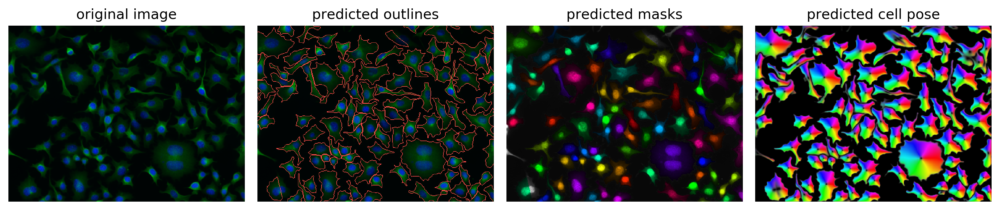

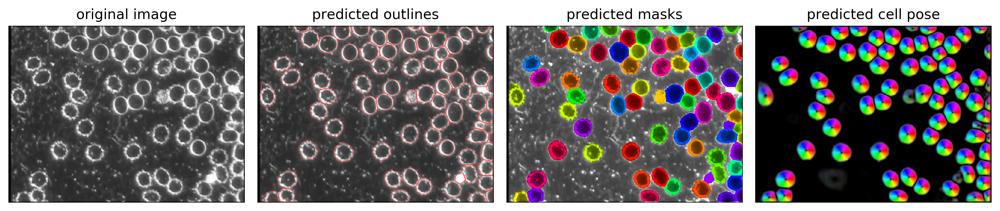

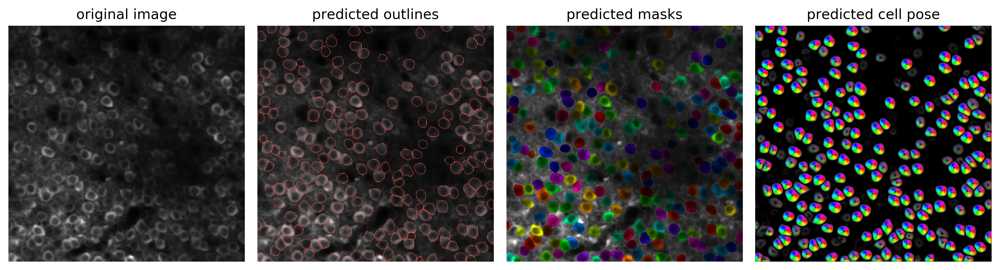

In [6]:
# DISPLAY RESULTS
from cellpose import plot

nimg = len(imgs)
for idx in range(nimg):
    maski = masks[idx]
    flowi = flows[idx][0]

    fig = plt.figure(figsize=(12,5))
    plot.show_segmentation(fig, imgs[idx], maski, flowi, channels=channels[idx])
    plt.tight_layout()
    plt.show()